<a href="https://colab.research.google.com/github/KunalVaidya99/Image-Captioning/blob/main/Image_Captioning_Various_Models_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%tensorflow_version 1.x

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [ ]:
import tensorflow as tf
import numpy as np
import os
from keras.layers import LSTM,Dense,Concatenate,Embedding,Input,Reshape,Lambda,RepeatVector,Add,TimeDistributed
from keras.models import Model
from keras.optimizers import Adam
from PIL import Image
import pandas as pd
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.models import Model

Using TensorFlow backend.


In [ ]:
captions = pd.read_csv('/content/gdrive/My Drive/Flickr_Data/Flickr8k.token.csv')

In [ ]:
captions.head()

,1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .
0,1000268201_693b08cb0e.jpg#1\tA girl going into...
1,1000268201_693b08cb0e.jpg#2\tA little girl cli...
2,1000268201_693b08cb0e.jpg#3\tA little girl cli...
3,1000268201_693b08cb0e.jpg#4\tA little girl in ...
4,1001773457_577c3a7d70.jpg#0\tA black dog and a...


In [ ]:
captions.columns = ['Captions']

In [ ]:
captions.head()

,Captions
0,1000268201_693b08cb0e.jpg#1\tA girl going into...
1,1000268201_693b08cb0e.jpg#2\tA little girl cli...
2,1000268201_693b08cb0e.jpg#3\tA little girl cli...
3,1000268201_693b08cb0e.jpg#4\tA little girl in ...
4,1001773457_577c3a7d70.jpg#0\tA black dog and a...


In [ ]:
captions = captions["Captions"].str.split("\t", n = 1, expand = True) 

In [ ]:
captions.columns = ['Imageid','captions']
captions.head()
cap = captions.iloc[:,1]

In [ ]:
cap.head()

0                A girl going into a wooden building .
1     A little girl climbing into a wooden playhouse .
2    A little girl climbing the stairs to her playh...
3    A little girl in a pink dress going into a woo...
4           A black dog and a spotted dog are fighting
Name: captions, dtype: object

In [ ]:
captions = captions['Imageid'].str.split('g',n=1,expand=True)
captions.head()

,0,1
0,1000268201_693b08cb0e.jp,#1
1,1000268201_693b08cb0e.jp,#2
2,1000268201_693b08cb0e.jp,#3
3,1000268201_693b08cb0e.jp,#4
4,1001773457_577c3a7d70.jp,#0


In [ ]:
data = [captions,cap]
data = pd.concat(data,axis=1)

In [ ]:
data.columns = ['imageid','cnumber','captions']

data['imageid'] = data['imageid'].astype(str) + 'g'
data.head()

,imageid,cnumber,captions
0,1000268201_693b08cb0e.jpg,#1,A girl going into a wooden building .
1,1000268201_693b08cb0e.jpg,#2,A little girl climbing into a wooden playhouse .
2,1000268201_693b08cb0e.jpg,#3,A little girl climbing the stairs to her playh...
3,1000268201_693b08cb0e.jpg,#4,A little girl in a pink dress going into a woo...
4,1001773457_577c3a7d70.jpg,#0,A black dog and a spotted dog are fighting


In [ ]:
def extract_features(directory):
  model = VGG16()
 
  model.layers.pop()
  model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
 
  print(model.summary())
  features = {}
  i=0
  for filename in os.listdir(directory):
    i+=1
    filename = directory +'/' + filename
    image = load_img(filename,target_size=(224,224))
    image = img_to_array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    feature = model.predict(image,verbose=1)
    features[filename] = feature
    print(i)
 
  return features

In [ ]:
features = extract_features('/content/gdrive/My Drive/Flickr_Data/Images')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
___________________________________________

KeyboardInterrupt: ignored

In [ ]:
dataarray = data.to_numpy()

In [ ]:
dataarray[0,0]

In [ ]:
#imageid = data['imageid'].astype(str)
print(features['/content/gdrive/My Drive/Flickr_Data/Images/381976882_0063d16d88.jpg'])

In [ ]:
import pickle
f = open("file.pkl","wb")
pickle.dump(features,f)
f.close()

In [ ]:
import pickle
infile = open('/content/gdrive/My Drive/VGG-19features.pkl','rb')
features = pickle.load(infile)
infile.close()

In [ ]:
import string
table = str.maketrans('', '', string.punctuation)
def remove_punctuation(text_string):
  word = text_string.split()
  textnew=""
  for word in word:
    word.translate(table)
    textnew += " " + word
  return textnew
def remove_character(text_string):
  textnew = ""
  for word in text_string.split():
    if(len(word)>1):
      textnew += " " + word 
  return textnew
def remove_numeric(text_string):
  textnew =""
  for word in text_string.split():
    isalpha = word.isalpha()
    if isalpha:
      textnew += " " + word 
  return textnew
def cleaning_text(text_string):
  text = remove_punctuation(text_string)
  text = remove_character(text)
  text = remove_numeric(text)
  return text

for i,caption in enumerate(data.captions.values):
  text_clean = cleaning_text(caption)
  data.captions.iloc[i] = text_clean
  

In [ ]:
data.head() #punctuations,single charcters and numerics removed

,imageid,cnumber,captions
0,1000268201_693b08cb0e.jpg,#1,girl going into wooden building
1,1000268201_693b08cb0e.jpg,#2,little girl climbing into wooden playhouse
2,1000268201_693b08cb0e.jpg,#3,little girl climbing the stairs to her playhouse
3,1000268201_693b08cb0e.jpg,#4,little girl in pink dress going into wooden c...
4,1001773457_577c3a7d70.jpg,#0,black dog and spotted dog are fighting


In [ ]:
def add_start_end_token(caption):
  cap = []
  for caption in caption:
    caption = "<start> " + caption + " <end>"
    cap.append(caption)
  return cap

data["captions"] = add_start_end_token(data["captions"])  


In [ ]:
data = data.drop([0,1,2,3])
data.head(20)

,imageid,cnumber,captions
4,1001773457_577c3a7d70.jpg,#0,<start> black dog and spotted dog are fightin...
5,1001773457_577c3a7d70.jpg,#1,<start> black dog and dog playing with each o...
6,1001773457_577c3a7d70.jpg,#2,<start> black dog and white dog with brown sp...
7,1001773457_577c3a7d70.jpg,#3,<start> Two dogs of different breeds looking ...
8,1001773457_577c3a7d70.jpg,#4,<start> Two dogs on pavement moving toward ea...
9,1002674143_1b742ab4b8.jpg,#0,<start> little girl covered in paint sits in ...
10,1002674143_1b742ab4b8.jpg,#1,<start> little girl is sitting in front of la...
11,1002674143_1b742ab4b8.jpg,#2,<start> small girl in the grass plays with fi...
12,1002674143_1b742ab4b8.jpg,#3,<start> There is girl with pigtails sitting i...
13,1002674143_1b742ab4b8.jpg,#4,<start> Young girl with pigtails painting out...


In [ ]:
#data =data.loc[data["cnumber"].values == "0",: ]
dimages =[]
keepindex=[]
#data = data.loc[data["cnumber"].values == "0",: ]
address = '/content/gdrive/My Drive/Flickr_Data/Images/'
j=0
for i, fnm in enumerate(data.imageid):
  j = j+1
  if j%4==0:

    if address+fnm in features.keys():
        dimages.append(features[address + fnm])
        keepindex.append(j-1)
        
fnames = data["imageid"].iloc[keepindex].values
dcaptions = data["captions"].iloc[keepindex].values
dimages = np.array(dimages)
print(dcaptions.shape)
print(fnames[:5])

(10112,)
['1001773457_577c3a7d70.jpg' '1002674143_1b742ab4b8.jpg'
 '1003163366_44323f5815.jpg' '1007129816_e794419615.jpg'
 '1007129816_e794419615.jpg']


In [ ]:
fnames

array([], dtype=object)

In [ ]:
data.head(20)

,imageid,cnumber,captions
4,1001773457_577c3a7d70.jpg,#0,<start> black dog and spotted dog are fightin...
5,1001773457_577c3a7d70.jpg,#1,<start> black dog and dog playing with each o...
6,1001773457_577c3a7d70.jpg,#2,<start> black dog and white dog with brown sp...
7,1001773457_577c3a7d70.jpg,#3,<start> Two dogs of different breeds looking ...
8,1001773457_577c3a7d70.jpg,#4,<start> Two dogs on pavement moving toward ea...
9,1002674143_1b742ab4b8.jpg,#0,<start> little girl covered in paint sits in ...
10,1002674143_1b742ab4b8.jpg,#1,<start> little girl is sitting in front of la...
11,1002674143_1b742ab4b8.jpg,#2,<start> small girl in the grass plays with fi...
12,1002674143_1b742ab4b8.jpg,#3,<start> There is girl with pigtails sitting i...
13,1002674143_1b742ab4b8.jpg,#4,<start> Young girl with pigtails painting out...


In [ ]:
from keras.preprocessing.text import Tokenizer 
tokenizer = Tokenizer(num_words=8000)
tokenizer.fit_on_texts(dcaptions)
vocab_size = len(tokenizer.word_index)+1
print("The Vocabulary Size : {}"  .format(vocab_size))
text_int = tokenizer.texts_to_sequences(dcaptions)

The Vocabulary Size : 4741


In [ ]:
maxlen = np.max([len(text) for text in text_int])
print("the max len of caption is : {}" .format(maxlen))  

the max len of caption is : 31


In [ ]:
forinput = []
for caption in text_int:
  #caption = caption.tolist()
  caption = caption[:-1]
  forinput.append(caption)

In [ ]:
print(forinput[0:5])
print(np.array(text_int).shape)

[[2, 7, 25, 5, 480, 854, 333, 114, 75], [2, 13, 26, 8, 1052, 568, 77, 4, 3, 40], [2, 11, 222, 5, 151, 48, 380, 12, 10, 43, 5, 197], [2, 3, 11, 8, 2350, 503, 6, 15, 217, 9, 32, 94, 90], [2, 3, 47, 55, 365, 5, 23, 1053, 5, 218]]
(8090,)


In [ ]:
from keras.utils import to_categorical
np.array(dimages).shape

(10112, 1, 4096)

In [ ]:
from keras.preprocessing.sequence import pad_sequences
n_size = dimages.shape[0]
split_size=0.9
train_text_int = text_int[:int(split_size*n_size)]
test_text_int = text_int[int(split_size*n_size):]
train_dimages = dimages[:int(split_size*n_size)]
test_dimages = dimages[int(split_size*n_size):]

def preprocess_dataset(text_int,dimages):
  outtext = []
  intext= []
  ximage = []
  for text,image in zip(text_int,dimages):
  
    for i in range(1,len(text)):
      in_text,out_text = text[:i],text[i]
      in_text = pad_sequences([in_text],maxlen=maxlen).flatten()
      out_text = to_categorical(out_text,num_classes=vocab_size)
      outtext.append(out_text)
      intext.append(in_text)
      ximage.append(image)
  intext = np.array(intext)
  outtext = np.array(outtext)
  ximage = np.array(ximage)    
  return intext,outtext,ximage


train_intext,train_outtext,train_ximage  = preprocess_dataset(train_text_int,train_dimages)
test_intext,test_outtext,test_ximage = preprocess_dataset(test_text_int,test_dimages)
  #in_text = to_categorical(in_text,num_classes=vocab_size)
  




In [ ]:
print(train_intext.shape)
print(test_outtext.shape)
print(test_ximage.shape)

(92620, 31)
(10256, 4741)
(10256, 1, 4096)


In [ ]:
Ty = maxlen
embed_dim = 64
vocab_size = vocab_size
LSTM_cell = LSTM(128,return_state=True)
densor = Dense(256,activation='relu')
densor1 = Dense(vocab_size,activation='softmax')
embed = Embedding(vocab_size,embed_dim,mask_zero=True)
reshapor = Reshape((1,vocab_size))
reshapor1 = Reshape((8356,1))
concatenator = Concatenate(axis=1)
addor = Add()
import keras.backend as K

In [ ]:
def ImageCaption(n_feature,vocab_size,maxlen,embed_dim):

  X_input = Input(shape=(1,n_feature))
  #X_cap = Input(shape=(1,33))
  X = Dense(8356,activation='relu')(X_input)
  #X = Reshape((1,1024))(X)
  X = Reshape((8356,))(X)
  print(X.shape)
  a0 = Input(shape=(128,))
  c0 = Input(shape=(128,))
  a = a0
  c = c0 
  print(a.shape)
  outputs = []
  capinput = Input(shape=(Ty-1,vocab_size))
  
  #cap = Reshape((vocab_size,1))(capinput)
  X = reshapor1(X)

  for i in range(0,32):
    
    #x = concatenator([X,cap]
    cap = Lambda(lambda cap:capinput[:,i,:])(capinput)
    cap = reshapor(cap)
    
    print(i)
    cap = addor([X,cap])
    a,_,c = LSTM_cell(inputs = cap,initial_state =[a,c])
    
    out = densor1(a)
    print(a.shape)
    outputs.append(out)
    
  model = Model(inputs=[X_input,capinput,a0,c0],outputs = outputs)
  return model

In [ ]:
def imagembed(n_feature,vocab_size,maxlen,embed_dim):

  X_input = Input(shape=(1,n_feature))
  #X_cap = Input(shape=(1,33))
  X = Dense(512,activation='relu')(X_input)
  #X = Reshape((1,1024))(X)
  X = Reshape((512,))(X)

  outputs = []
  capinput = Input(shape=(maxlen,))
  cap = Embedding(vocab_size,embed_dim)(capinput)
  print(cap.shape)
  

  cap = LSTM(512)(cap)

  cap = addor([cap,X])

  cap = Reshape((1,512))(cap)

  cap = LSTM(512)(cap)



  cap = (Dense(vocab_size,activation='softmax'))(cap)

  model = Model(inputs = [X_input,capinput],outputs = cap)

  return model





In [ ]:
imagembed = imagembed(4096,vocab_size,maxlen,300)

(?, 31, 300)


In [ ]:
imagembed.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           (None, 31)           0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            (None, 1, 4096)      0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 31, 300)      1422300     input_10[0][0]                   
__________________________________________________________________________________________________
dense_13 (Dense)                (None, 1, 512)       2097664     input_9[0][0]                    
____________________________________________________________________________________________

In [ ]:
def MergeModel(n_features,vocab_size,maxlen,embed_dim):

  X_input = Input(shape=(1,n_features))

  X = Dense(256,activation='relu')(X_input)

  capinput = Input(shape=(maxlen,))

  cap = Embedding(vocab_size,embed_dim)(capinput)

  hidden = LSTM(units=256)(cap)

  hidden = Reshape((1,256))(hidden)

  out = Concatenate()([X,hidden])

  out = Dense(vocab_size,activation='softmax')(out)

  out = Reshape((vocab_size,))(out)

  model = Model(inputs=[X_input,capinput],outputs=out)

  return model



In [ ]:
MergeModel = MergeModel(4096,vocab_size,maxlen,300)

In [ ]:
MergeModel.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 33)           0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 33, 300)      1305900     input_6[0][0]                    
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 1, 4096)      0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 256)          570368      embedding_4[0][0]                
____________________________________________________________________________________________

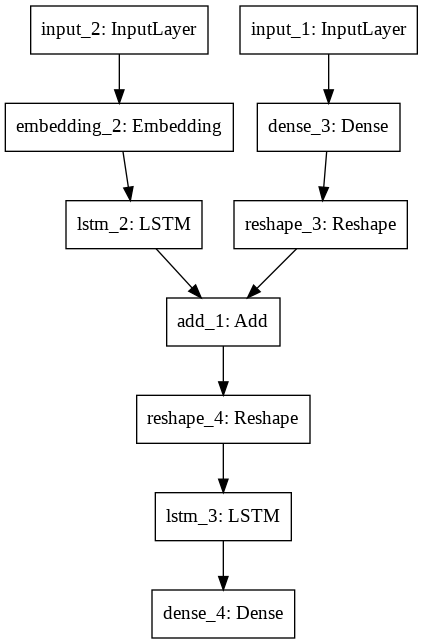

In [ ]:
from keras.utils import plot_model
plot_model(imagembed, to_file='model.png')

In [ ]:
from keras.models import model_from_json    #Loading Previously Trained Injection Model
json_file = open('ImageCaptioningInjection.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
imagembed = model_from_json(loaded_model_json)
# load weights into new model
imagembed.load_weights("ImageCaptioningInjection.h5")
print("Loaded model from disk")

Loaded model from disk


In [ ]:
from keras.models import model_from_json   #Loading Previously Trained Merge Model
json_file = open('ImageCaptioningMerge.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
MergeModel = model_from_json(loaded_model_json)
# load weights into new model
MergeModel.load_weights("ImageCaptioningMerge.h5")
print("Loaded model from disk")

Loaded model from disk


In [ ]:
import keras
lr_schedule = keras.callbacks.LearningRateScheduler(lambda epoch:1e-8*10**(epoch/10))
opt = Adam(learning_rate=1e-8)
imagembed.compile(optimizer=opt,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
historyad = imagembed.fit(x=[train_ximage,train_intext],y=np.array(train_outtext),epochs=50,batch_size=64,
                          validation_data=([test_ximage,test_intext],test_outtext))

Train on 92620 samples, validate on 10256 samples
Epoch 1/50
92620/92620 [==============================] - 61s 655us/step - loss: 8.4606 - accuracy: 3.5629e-04 - val_loss: 8.4604 - val_accuracy: 2.9251e-04
Epoch 2/50
92620/92620 [==============================] - 60s 648us/step - loss: 8.4590 - accuracy: 4.4267e-04 - val_loss: 8.4589 - val_accuracy: 3.9002e-04
Epoch 3/50
92620/92620 [==============================] - 60s 649us/step - loss: 8.4573 - accuracy: 6.9100e-04 - val_loss: 8.4573 - val_accuracy: 7.8003e-04
Epoch 4/50
92620/92620 [==============================] - 60s 643us/step - loss: 8.4557 - accuracy: 9.5012e-04 - val_loss: 8.4557 - val_accuracy: 9.7504e-04
Epoch 5/50
92620/92620 [==============================] - 59s 640us/step - loss: 8.4541 - accuracy: 0.0013 - val_loss: 8.4541 - val_accuracy: 0.0017
Epoch 6/50
92620/92620 [==============================] - 60s 647us/step - loss: 8.4525 - accuracy: 0.0018 - val_loss: 8.4525 - val_accuracy: 0.0024
Epoch 7/50
92620/92620 [

In [ ]:
opt = Adam(learning_rate=0.0001)
MergeModel.compile(optimizer=opt,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
historymerge = MergeModel.fit(x=[train_ximage,train_intext],y=np.array(train_outtext),epochs=50,batch_size=64,
                                                  validation_data=([test_ximage,test_intext],test_outtext))

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 67864 samples, validate on 16990 samples
Epoch 1/50
67864/67864 [==============================] - 39s 570us/step - loss: 5.4661 - accuracy: 0.1239 - val_loss: 5.0849 - val_accuracy: 0.1523
Epoch 2/50
67864/67864 [==============================] - 38s 566us/step - loss: 4.5564 - accuracy: 0.1925 - val_loss: 4.7220 - val_accuracy: 0.2117
Epoch 3/50
67864/67864 [==============================] - 38s 567us/step - loss: 3.9140 - accuracy: 0.2489 - val_loss: 4.4757 - val_accuracy: 0.2399
Epoch 4/50
67864/67864 [==============================] - 38s 560us/step - loss: 3.4124 - accuracy: 0.2834 - val_loss: 4.3806 - val_accuracy: 0.2513
Epoch 5/50
67864/67864 [==============================] - 38s 562us/step - loss: 3.0305 - accuracy: 0.3142 - val_loss: 4.3289 - val_accuracy: 0.2597
Epoch 6/50
67864/67864 [==============================] - 38s 558us/step - loss: 2.7395 - accuracy: 0.3440 - va

KeyboardInterrupt: ignored

In [ ]:
import matplotlib.pyplot as plt
def plot_loss(historymerge):
  loss = historymerge.history['loss']
  accuracy = historymerge.history['accuracy']
  fig = plt.figure(figsize=(10,10))

  epochs = range(len(loss))
  count = 1
  ax = fig.add_subplot(2,2,1)
  ax.plot(epochs,loss)
  
  ax = fig.add_subplot(2,2,3)
  plt.axis('off')
  ax.text(0,1,'Loss Function Plot',color='white')
  ax = fig.add_subplot(2,2,2)
  ax.plot(epochs,accuracy)
  ax = fig.add_subplot(2,2,4)
  plt.axis('off')
  ax.text(0,1,'Accuracy Plot',color='white')

 

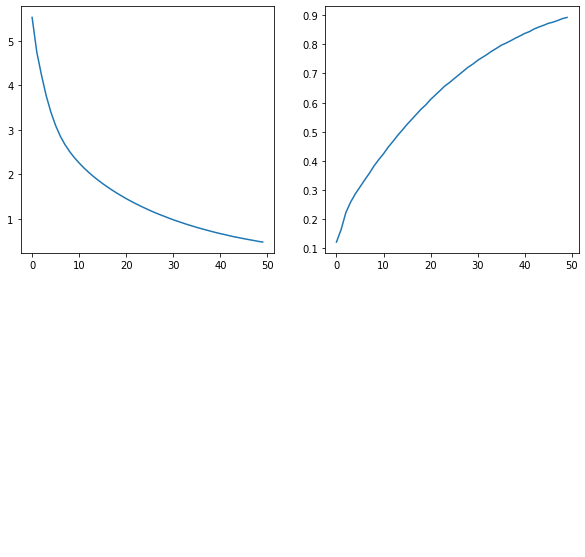

In [ ]:
#plot_loss(historyad)
plot_loss(historymerge)

In [ ]:
#ix_to_word = dict{i,ch for ch,i in tokenizer.word}
def caption_predict(photo,captionmodel):

  word = 'start'
  maxlen=31
  for i in range(maxlen):
    #inputcaption = tokenizer.word_index[word]
    inputcaption = tokenizer.texts_to_sequences([word])[0]
    inputcaption = pad_sequences([inputcaption],maxlen).flatten()
    inputcaption = inputcaption.reshape(maxlen,1)
    output = captionmodel.predict(x=[photo,inputcaption.T])
    nextword = tokenizer.index_word[np.argmax(output)]
    word = word + " " + nextword
    if nextword =='end':
      break;
  return word 

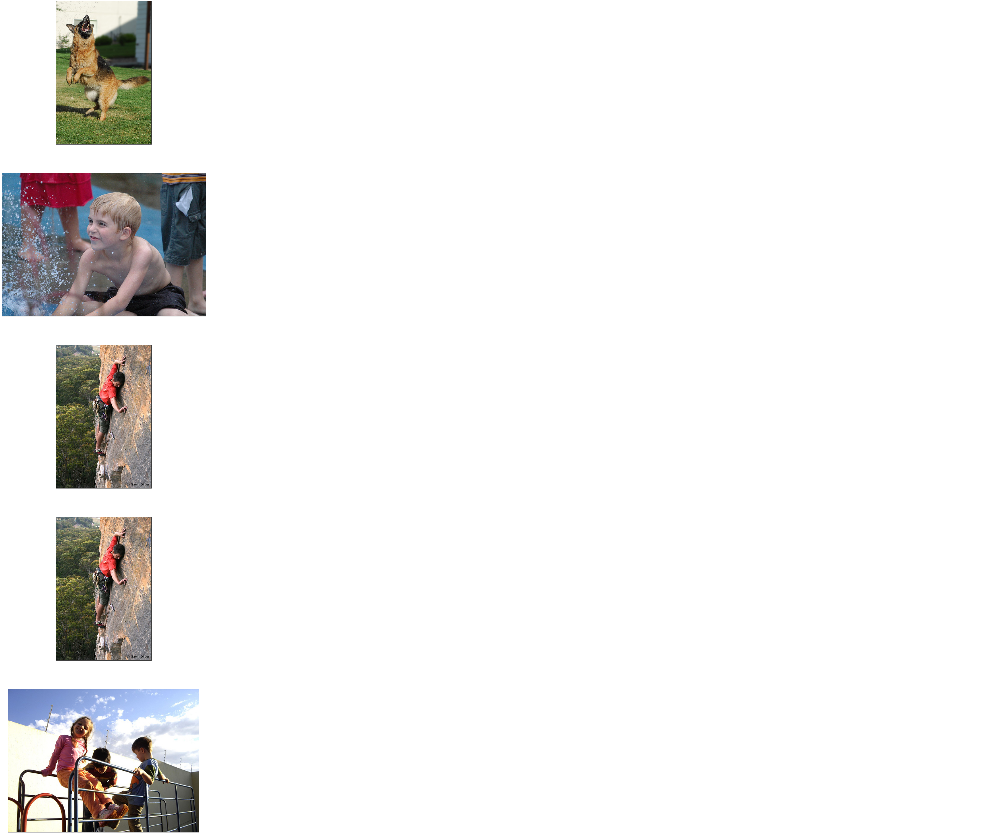

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))
nstart = 10000
nend = 10005
count=1
for fname,imagfeat,truecapt in zip(fnames[nstart:nend],dimages[nstart:nend],dcaptions[nstart:nend]):
  #print(fnames) 
  imag = load_img('/content/gdrive/My Drive/Flickr_Data/Images/'+ fname)
  ax = fig.add_subplot(nend-nstart,2,count,xticks=[],yticks=[])
  ax.imshow(imag)
  count = count + 1
  caption = caption_predict(imagfeat.reshape(1,1,4096),imagembed)
  #captionembed = caption_predict(imagfeat.reshape(1,1,4096),MergeModel)
  ax= fig.add_subplot(nend-nstart,2,count)
  plt.axis('off')
  caption = 'predicted for Add Model: ' + caption
  ax.text(0,0.5,caption,size=100,style='italic',color='white')
  true = 'True : ' +truecapt
  ax.text(0,0.75,true,style='italic',size=100,color='white')
  #Add = 'predicted for Merge Model: ' + captionembed
  #ax.text(0,0.25,Add,style='italic',size=100,color='white')
  count = count+1
  #print(caption)


In [ ]:
def predict_custom_image(photo):
  
  model = VGG16()

  model.layers.pop()
  model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
  base = load_img(photo)
  image = load_img(photo,target_size=(224,224))
  image = img_to_array(image)
  image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
  image = preprocess_input(image)
  imagevector = model.predict(image)

  fig = plt.figure(figsize=(25,25))

  #customcaptionmerge = caption_predict(imagevector.reshape(1,1,4096),MergeModel)
  customcaptionadd = caption_predict(imagevector.reshape(1,1,4096),imagembed)
  ax = fig.add_subplot(1,2,1)
  ax.imshow(base)
  ax = fig.add_subplot(1,2,2)
  plt.axis('off')
  #ax.text(0,0.55,"Predicted for Merge Model :"+ customcaptionmerge,size=30,color='white')
  ax.text(0,0.5,"Predicted for Add Model :"+ customcaptionadd,size=30,color='white')






In [ ]:
predict_custom_image('test1.jpg')

In [ ]:
from keras.models import model_from_json
model_json = imagembed.to_json()
with open("ImageCaptioningAdd2layer.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
imagembed.save_weights("ImageCaptioningAdd2layer.h5")
print("Saved model to disk")

Saved model to disk
